In [1]:
import os 
os.chdir("/home/canyon/Bus-Weather-Impacts")
from src.utils import *
from src.bus_functions import *
import pandas as pd
import os
import osmnx as ox
import numpy as np
import geopandas as gpd
import networkx as nx
from sklearn.neighbors import KDTree
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np
pd.options.mode.chained_assignment = None
pd.set_option('display.float_format', '{:.02f}'.format)
from geopy.distance import geodesic
from shapely.geometry import Point
calculated_pair_path = "data/node_pairs.parquet"
pd.set_option('display.max_columns', None)
from plotnine import *
from shapely.geometry import LineString, Point


In [2]:
GTFS_PATH = "https://urbantech-public.s3.amazonaws.com/DO-NOT-DELETE-BUSOBSERVATORY-PUBLIC-DATASET/one-system-day.tar.gz"
NYC_gtfs_rt = read_parquet_from_tar_gz(GTFS_PATH)
NYC_gtfs_rt = gpd.GeoDataFrame(
        NYC_gtfs_rt, 
        geometry=gpd.points_from_xy(NYC_gtfs_rt.lon, NYC_gtfs_rt.lat), 
        crs="EPSG:4326"
    )

In [3]:
tree, nodes, G = get_node_data()

In [4]:
segmented_data = gpd.read_parquet("/home/canyon/Bus-Weather-Impacts/data/buses_with_segmented_test.parquet").to_crs(4326)

In [5]:
path_nodes = nx.shortest_path(G, 598367717, 42949762)

In [6]:
def plot_shortest_path(shortest_path, nodes, draw_lines=True, draw_dots = True):
    # Filter the nodes DataFrame to only include the nodes in the shortest_path
    path_nodes = nodes[nodes['osmid'].isin(shortest_path)].set_index('osmid').loc[shortest_path]
    
    # Create a GeoDataFrame from the path nodes
    gdf = gpd.GeoDataFrame(
        path_nodes, 
        geometry=gpd.points_from_xy(path_nodes.x, path_nodes.y), 
        crs="EPSG:4326"
    ).to_crs(3857)

    # Plot the nodes
    fig, ax = plt.subplots(figsize=(20, 20))
    if draw_dots:
        gdf.plot(ax=ax, marker='o', color='red', markersize=50, label='Nodes')
    else:
        gdf.plot(ax=ax, marker='o', color='red', markersize=50, alpha = 0, label='Nodes')


    # Optionally plot the path lines
    if draw_lines:
        line = LineString(gdf.geometry.tolist())
        line_gdf = gpd.GeoDataFrame(geometry=[line], crs=3857)
        line_gdf.plot(ax=ax, color='blue', linewidth=5, label='Path')

    # Add basemap
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

    # Add labels and legend
    plt.legend()
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Shortest Path')

    plt.show()


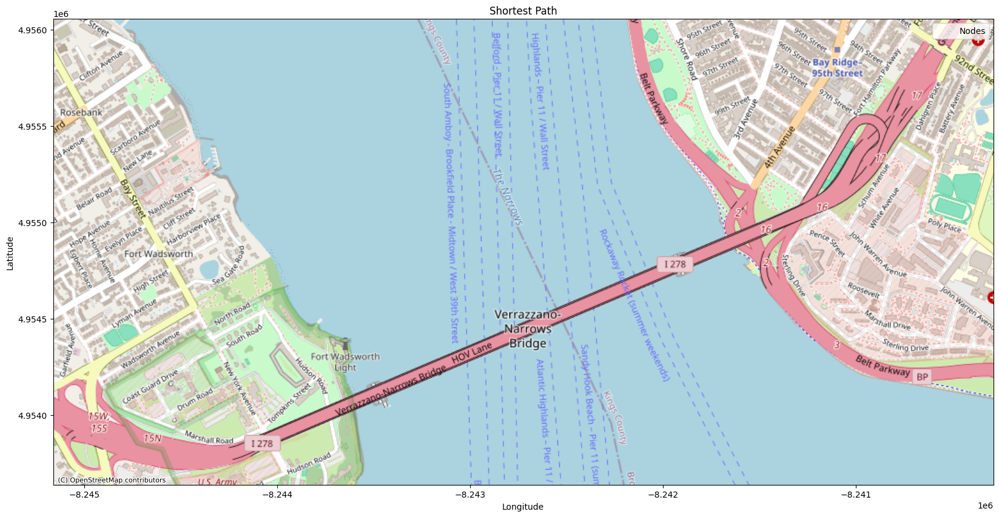

In [7]:
plot_shortest_path(path_nodes, nodes, draw_lines=False, draw_dots = False)

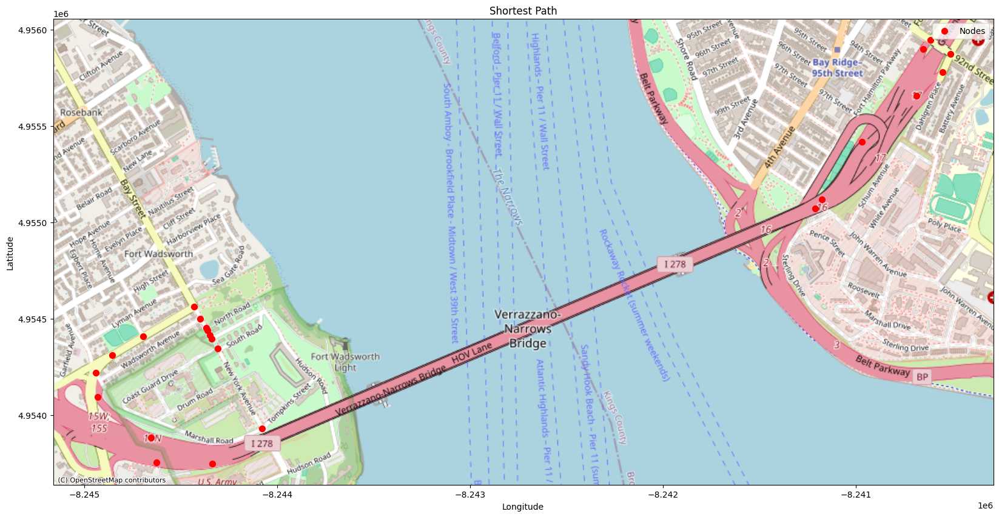

In [8]:
plot_shortest_path(path_nodes, nodes, draw_lines=False, draw_dots = True)

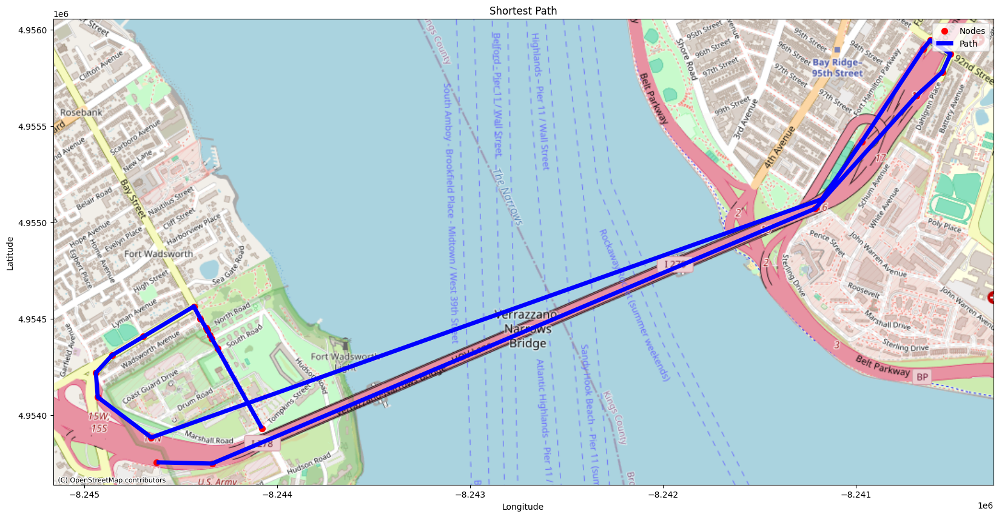

In [9]:
plot_shortest_path(path_nodes, nodes, draw_lines=True, draw_dots = True)

In [10]:
def plot_paths_with_speeds(paths_df, nodes, draw_lines=True, draw_points = True, legend = False, line_size = 8):
    # Merge the 'from' and 'to' nodes with their coordinates
    merged_from = paths_df.merge(nodes, left_on='from', right_on='osmid', suffixes=('', '_from'))
    merged_to = paths_df.merge(nodes, left_on='to', right_on='osmid', suffixes=('', '_to'))

    # Create a GeoDataFrame with LineStrings between 'from' and 'to' nodes
    lines = []
    for i in range(len(paths_df)):
        line = LineString([
            (merged_from.iloc[i]['x'], merged_from.iloc[i]['y']),
            (merged_to.iloc[i]['x'], merged_to.iloc[i]['y'])
        ])
        lines.append(line)

    # Create a GeoDataFrame for the lines
    line_gdf = gpd.GeoDataFrame(paths_df, geometry=lines, crs="EPSG:4326").to_crs(3857)

    # Plot the lines with color based on speed
    fig, ax = plt.subplots(figsize=(20, 20))
    if draw_lines:
        norm = plt.Normalize(line_gdf['speed'].min(), line_gdf['speed'].max())
        cmap = plt.get_cmap('viridis')
        line_gdf.plot(ax=ax, linewidth=line_size, column='speed', cmap=cmap, norm=norm, legend=legend)

    # Plot the nodes if needed
    nodes_gdf = gpd.GeoDataFrame(
        nodes,
        geometry=gpd.points_from_xy(nodes.x, nodes.y),
        crs="EPSG:4326"
    ).to_crs(3857).merge(merged_from[["osmid"]])

    if draw_points:
        nodes_gdf.plot(ax=ax, marker='o', color='red', markersize=50, label='Nodes', alpha=1.0)

    # Add basemap
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

    # Add labels and legend
    plt.legend()
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Paths Colored by Speed')

    plt.show()

In [11]:
avg_speeds = segmented_data.query("route == 'M72'").groupby(["from", "to"]).agg(
    speed=("speed_osm", "mean"), 
    total_obs=("speed_osm", "size")
).reset_index().query("total_obs > 10")
avg_speeds.head(3)

,from,to,speed,total_obs
3,42428634.00,6207264908.00,2.34,39
4,42429680.00,42455693.00,7.67,79
5,42429682.00,42445227.00,8.00,32


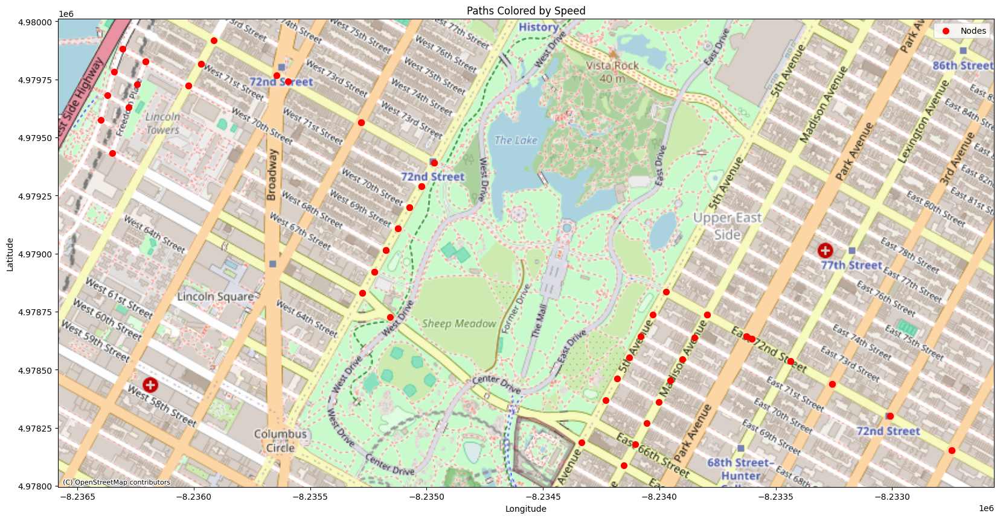

In [12]:
plot_paths_with_speeds(avg_speeds, nodes, draw_lines = False)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


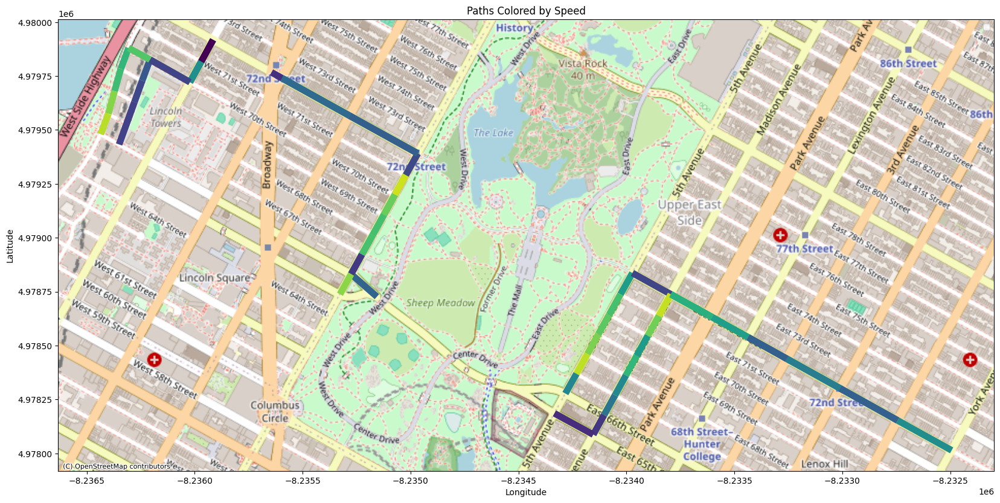

In [13]:
plot_paths_with_speeds(avg_speeds, nodes, draw_points = False, legend = False)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


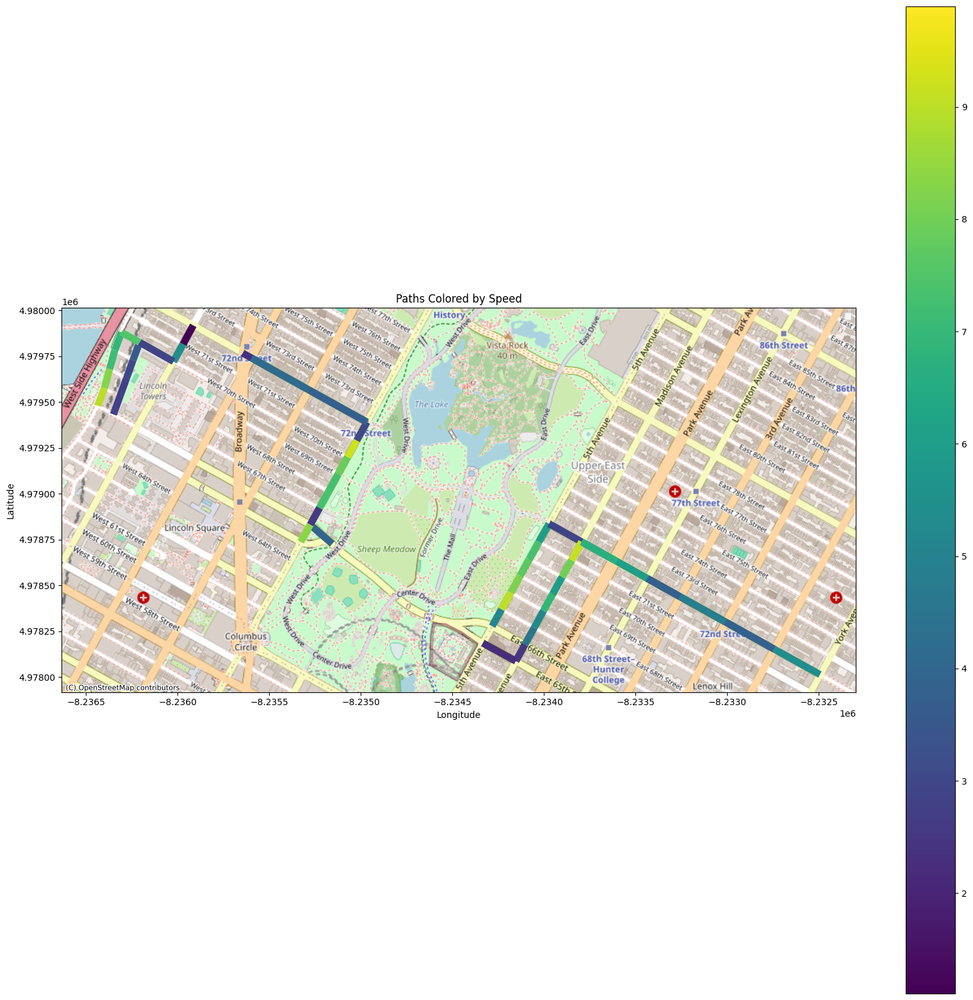

In [14]:
plot_paths_with_speeds(avg_speeds, nodes, draw_points = False, legend = True)

In [15]:
def plot_raw_gtfs(points):
    fig, ax = plt.subplots(figsize=(20, 20))
    points.to_crs(3857).plot(ax=ax, marker='o', color='red', markersize=20)
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

    # Add labels and legend
    plt.legend()
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Paths Colored by Speed')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


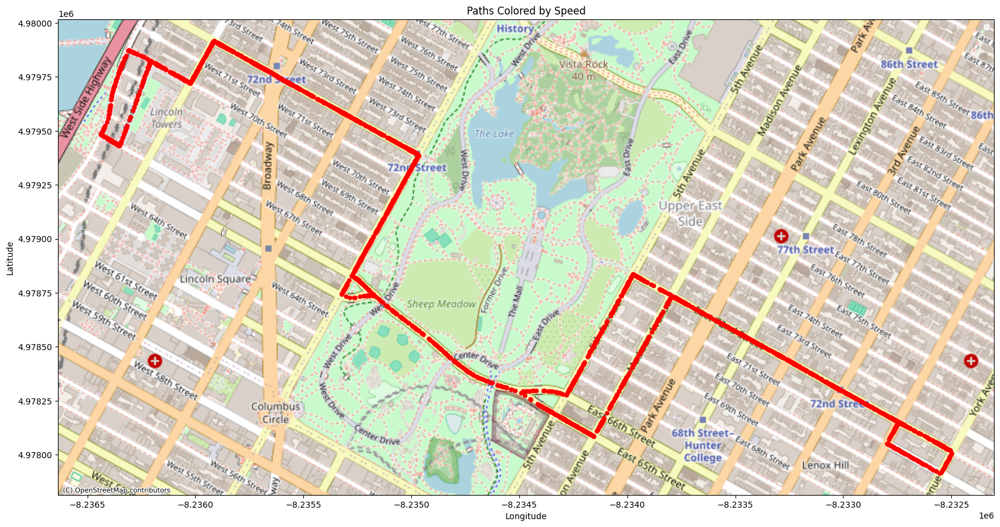

In [16]:
plot_raw_gtfs(NYC_gtfs_rt.query("route == 'M72'"))

In [17]:
segmented_data["truncated_speed"] = np.where(segmented_data["speed_osm"] < 150, segmented_data["speed_osm"], 150)

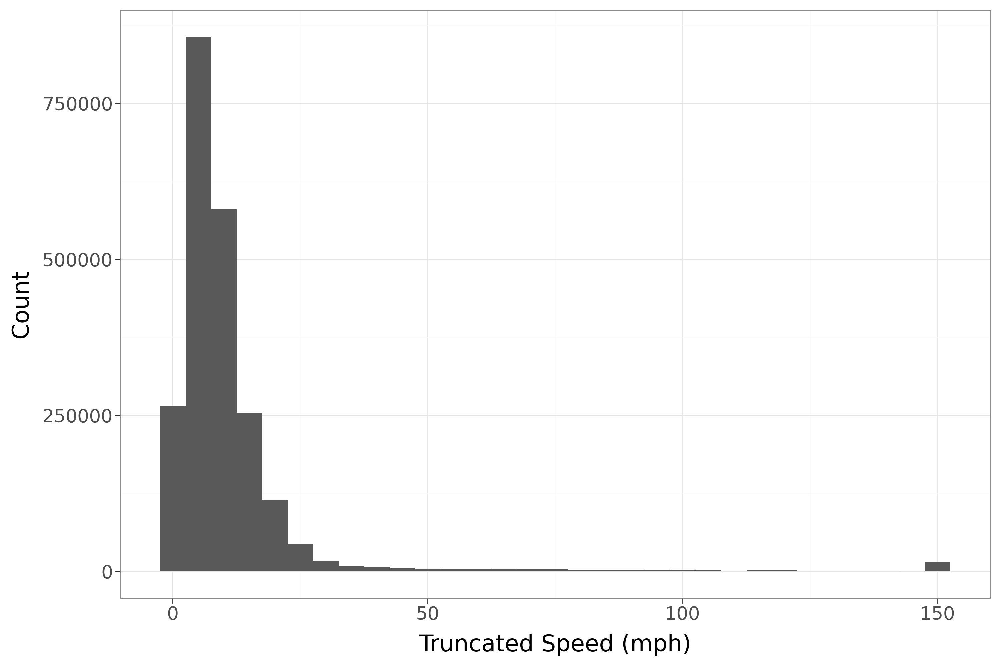

In [18]:
(ggplot(segmented_data, aes(x = "truncated_speed")) + geom_histogram(binwidth = 5) + theme_bw(base_size = 25) + theme(figure_size=(15,10)) + labs(x = "Truncated Speed (mph)", y = "Count"))

In [19]:
manhattan_crosstown_buses = pd.Series([
    "M14A",
    "M14D",
    "M23",
    "M34",
    "M34A",
    "M42",
    "M50",
    "M57",
    "M66",
    "M72",
    "M79",
    "M86",
    "M96",
    "M106",
    "M116"
])

In [20]:
avg_speeds = segmented_data.query("route.isin(@manhattan_crosstown_buses)").groupby(["from", "to"]).agg(
    speed=("speed_osm", "median"), 
    total_obs=("speed_euclid", "size")
).reset_index().query("total_obs > 1")
avg_speeds.head(3)

,from,to,speed,total_obs
0,42421731.00,42421737.00,5.26,82
1,42421731.00,42432737.00,5.63,94
2,42421737.00,42421731.00,4.53,64


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


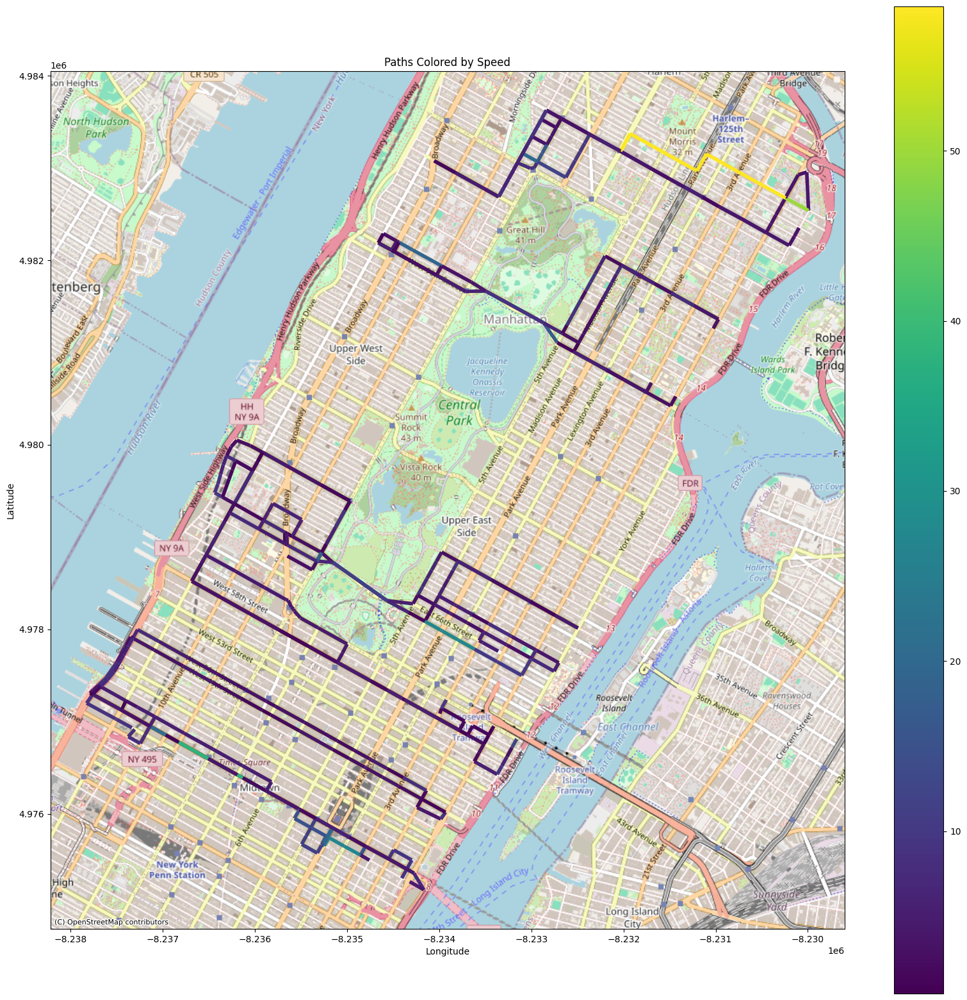

In [21]:
plot_paths_with_speeds(avg_speeds, nodes, draw_points = False, legend = True, line_size = 4)

In [22]:
avg_speeds = segmented_data.query("route.str.startswith('M')").groupby(["from", "to"]).agg(
    speed=("speed_osm", "median"), 
    total_obs=("speed_osm", "size")
).reset_index().query("total_obs > 10")
avg_speeds.head(3)

,from,to,speed,total_obs
0,42421728.00,42432736.00,6.40,76
1,42421728.00,42435337.00,9.14,41
2,42421731.00,42421737.00,5.49,137


/home/canyon/.local/share/virtualenvs/TOP-Sprint-lAvM2-mU/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 15523 rows containing non-finite values.


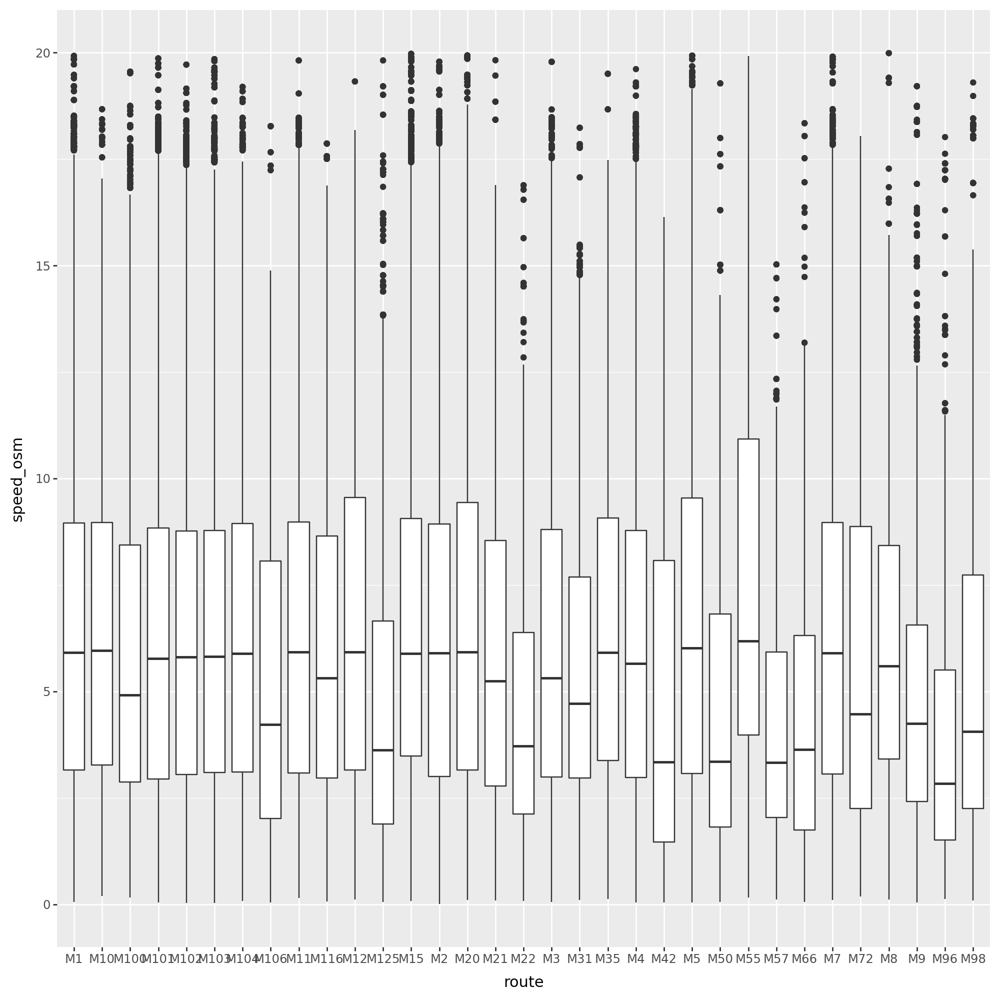

In [23]:
(ggplot(segmented_data.query("route.str.startswith('M')"), aes(y = 'speed_osm', x = "route")) + geom_boxplot() + ylim(0, 20) + theme(figure_size = (10, 10)))

In [24]:
borough_map = {
    'M': 'Manhattan',
    'BX': 'Bronx',
    'B': 'Brooklyn',
    'Q': 'Queens',
    'S': 'Staten Island',
    'X': 'Cross-borough'
}

def get_borough(route):
    for prefix, borough in borough_map.items():
        if route.startswith(prefix):
            return borough
    return 'Unknown'  # In case the route doesn't match any known prefix

# Apply the function to create the new column
segmented_data['borough'] = segmented_data['route'].apply(get_borough)


In [25]:
segmented_data.query("borough == 'Unknown'")

,route,timestamp,trip_id,origin_id,next_stop_id,osmid,vehicle_id,distance_to_node,geometry,prev_stop_id,prev_osmid,next_osmid,stop_name_prev,stop_name_next,shortest_path_stops,in_bus_path,time_diff_seconds,distance_osm,distance_euclid,shortest_path,dist_ratio,speed_osm,speed_euclid,idx,from,to,truncated_speed,borough


In [26]:
# Define the desired order of categories
borough_order = ["Bronx", "Manhattan", "Brooklyn", "Cross-borough", "Queens", "Staten Island"]

# Convert the 'borough' column to an ordered categorical type
segmented_data["borough"] = pd.Categorical(segmented_data["borough"], categories=borough_order, ordered=True)


/home/canyon/.local/share/virtualenvs/TOP-Sprint-lAvM2-mU/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 18899 rows containing non-finite values.


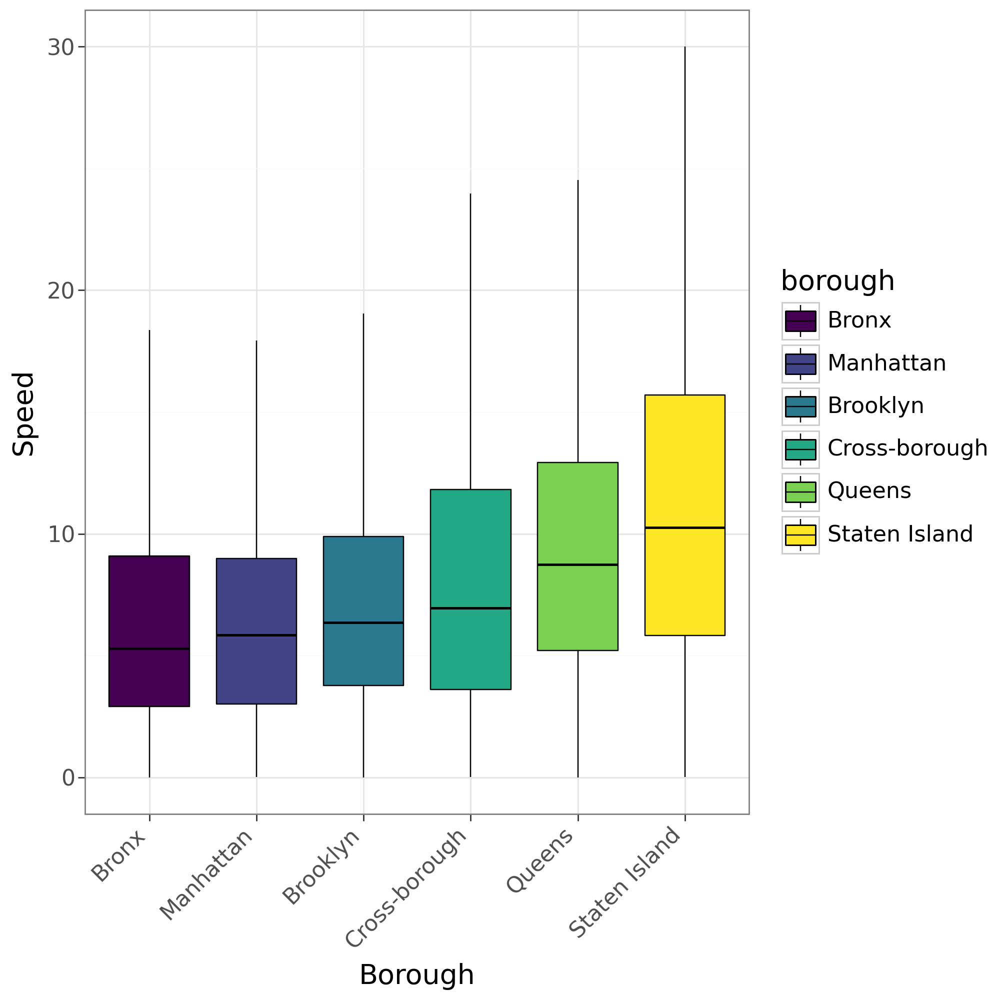

In [42]:
(ggplot(segmented_data.query("speed_osm < 40"), aes(y = 'speed_osm', x = "borough", fill = "borough")) +  geom_boxplot(outlier_shape='',  color = "black")  + 
  ylim(0, 30) +  theme_bw(base_size = 20) + theme(figure_size = (10, 10), axis_text_x=element_text(rotation=45, hjust=1)) + labs(x = "Borough", y = "Speed"))

In [28]:
segmented_data["hour"] =segmented_data.timestamp.dt.hour

In [29]:
plot_dat = segmented_data.groupby(["borough", "hour"])["speed_osm"].median().reset_index()

/tmp/ipykernel_14490/4062757025.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


/home/canyon/.local/share/virtualenvs/TOP-Sprint-lAvM2-mU/lib/python3.9/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 5 rows containing missing values.


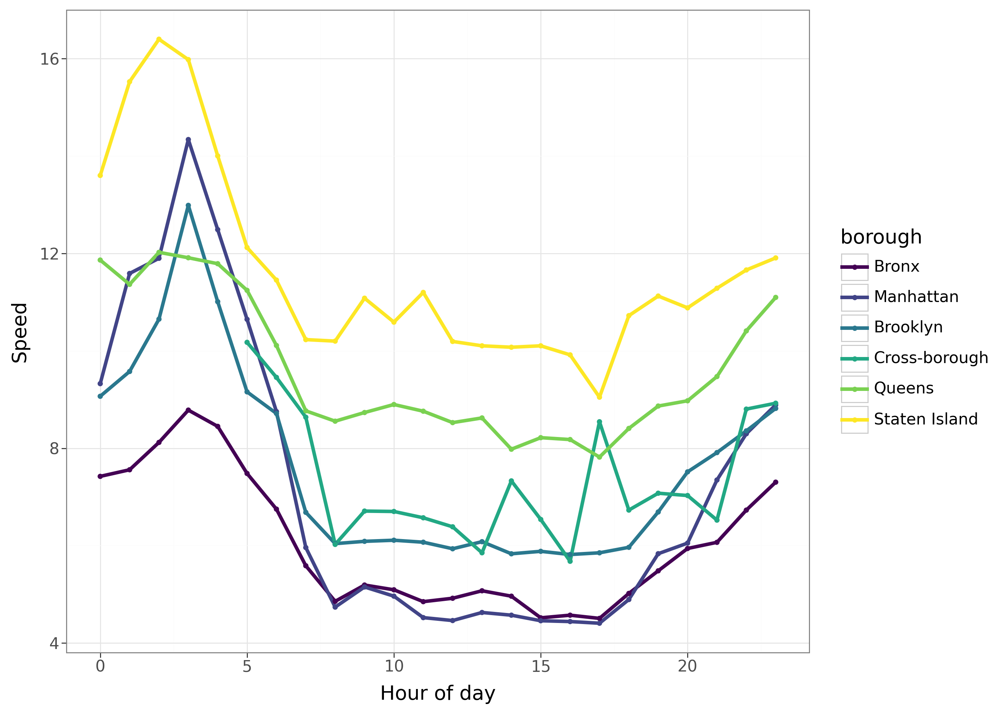

In [43]:
(ggplot(plot_dat, aes(x = "hour", y = "speed_osm", color = "borough")) + geom_line(size = 2) + geom_point(size = 2)+ theme_bw(base_size = 20) + theme(figure_size=(14,10)) + labs(x = "Hour of day", y = "Speed"))

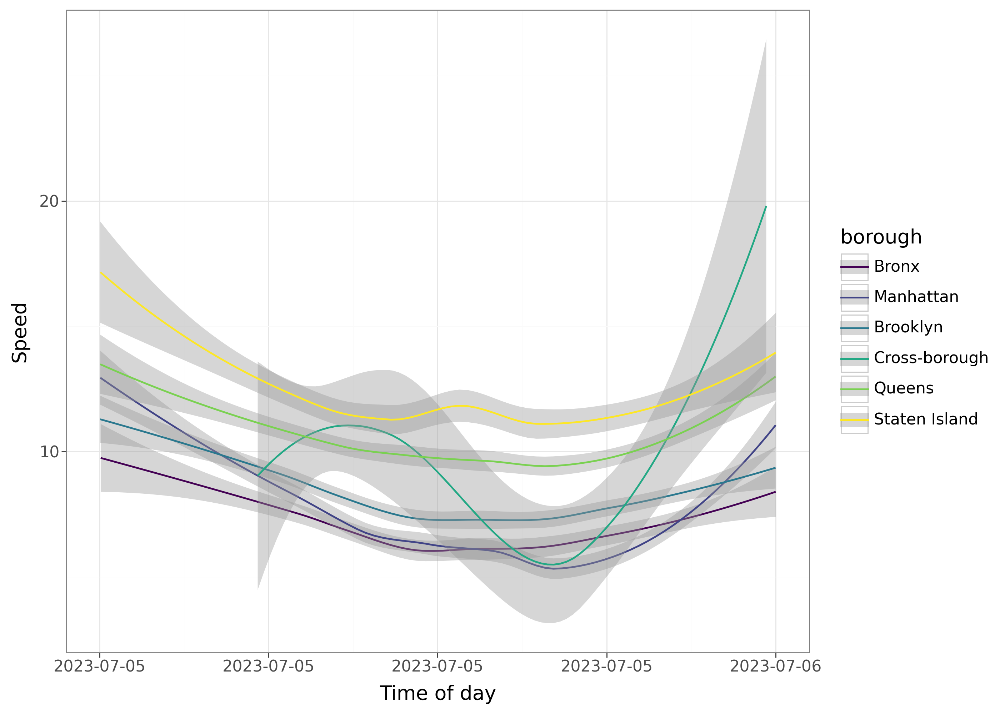

In [37]:
(ggplot(segmented_data.sample(20000).query("speed_osm < 60"), aes(x = "timestamp", y = "speed_osm", color = "borough")) + geom_smooth(method = "loess") + theme_bw(base_size = 20) + theme(figure_size=(14,10)) + labs(x = "Time of day", y = "Speed"))

In [48]:
segmented_data.groupby("route")["speed_osm"].describe(percentiles = [0.1, .25, .5, .75, .90]).reset_index().sort_values("50%")

,route,count,mean,std,min,10%,25%,50%,75%,90%,max
20,B39,99.00,3.38,3.14,0.13,0.38,0.64,1.76,5.26,8.88,8.88
125,M96,2542.00,4.38,4.87,0.12,0.89,1.56,2.88,5.75,9.29,43.93
220,SIM8X,92.00,4.74,4.20,0.17,0.27,0.95,2.96,9.59,10.96,12.15
119,M57,2121.00,4.24,2.96,0.11,1.10,2.04,3.33,5.92,8.90,15.03
117,M50,1176.00,4.95,4.34,0.05,0.97,1.82,3.38,7.02,10.70,22.23
...,...,...,...,...,...,...,...,...,...,...,...
179,S74,21614.00,17.38,24.55,0.09,4.52,8.03,12.97,19.12,26.38,322.86
163,S40,6564.00,13.45,7.53,0.33,3.56,7.28,13.01,18.86,24.42,34.77
172,S55,3703.00,17.24,18.36,0.23,5.23,9.04,14.28,21.32,26.69,171.58
173,S56,2903.00,14.89,6.72,0.28,4.91,10.42,14.94,19.99,23.89,32.12


In [49]:
segmented_data.query("route == 'B39'")

,route,timestamp,trip_id,origin_id,next_stop_id,osmid,vehicle_id,distance_to_node,geometry,prev_stop_id,prev_osmid,next_osmid,stop_name_prev,stop_name_next,shortest_path_stops,in_bus_path,time_diff_seconds,distance_osm,distance_euclid,shortest_path,dist_ratio,speed_osm,speed_euclid,idx,from,to,truncated_speed,borough,hour
713630,B39,2023-07-05 07:35:40,MTA NYCT_GA_C3-Weekday-SDon-045000_B24_6,MTA_303117,MTA_404167,42429769.00,MTA NYCT_7223,52.36,POINT (-73.98898 40.71887),MTA_403679,42429809.00,486868830.00,DELANCEY ST/ESSEX ST,ALLEN ST/DELANCEY ST,"[42429773.0, 42429769.0, 42429766.0, 486868830.0]",True,367.00,863.49,603.54,"[42429809.0, 4300940094.0, 7500756892.0, 42427...",0.70,5.26,3.68,206780,42429809.00,4300940094.00,5.26,Brooklyn,7
713631,B39,2023-07-05 07:35:40,MTA NYCT_GA_C3-Weekday-SDon-045000_B24_6,MTA_303117,MTA_404167,42429769.00,MTA NYCT_7223,52.36,POINT (-73.98898 40.71887),MTA_403679,42429809.00,486868830.00,DELANCEY ST/ESSEX ST,ALLEN ST/DELANCEY ST,"[42429773.0, 42429769.0, 42429766.0, 486868830.0]",True,367.00,863.49,603.54,"[42429809.0, 4300940094.0, 7500756892.0, 42427...",0.70,5.26,3.68,206780,4300940094.00,7500756892.00,5.26,Brooklyn,7
713632,B39,2023-07-05 07:35:40,MTA NYCT_GA_C3-Weekday-SDon-045000_B24_6,MTA_303117,MTA_404167,42429769.00,MTA NYCT_7223,52.36,POINT (-73.98898 40.71887),MTA_403679,42429809.00,486868830.00,DELANCEY ST/ESSEX ST,ALLEN ST/DELANCEY ST,"[42429773.0, 42429769.0, 42429766.0, 486868830.0]",True,367.00,863.49,603.54,"[42429809.0, 4300940094.0, 7500756892.0, 42427...",0.70,5.26,3.68,206780,7500756892.00,42427346.00,5.26,Brooklyn,7
713633,B39,2023-07-05 07:35:40,MTA NYCT_GA_C3-Weekday-SDon-045000_B24_6,MTA_303117,MTA_404167,42429769.00,MTA NYCT_7223,52.36,POINT (-73.98898 40.71887),MTA_403679,42429809.00,486868830.00,DELANCEY ST/ESSEX ST,ALLEN ST/DELANCEY ST,"[42429773.0, 42429769.0, 42429766.0, 486868830.0]",True,367.00,863.49,603.54,"[42429809.0, 4300940094.0, 7500756892.0, 42427...",0.70,5.26,3.68,206780,42427346.00,42437067.00,5.26,Brooklyn,7
713634,B39,2023-07-05 07:35:40,MTA NYCT_GA_C3-Weekday-SDon-045000_B24_6,MTA_303117,MTA_404167,42429769.00,MTA NYCT_7223,52.36,POINT (-73.98898 40.71887),MTA_403679,42429809.00,486868830.00,DELANCEY ST/ESSEX ST,ALLEN ST/DELANCEY ST,"[42429773.0, 42429769.0, 42429766.0, 486868830.0]",True,367.00,863.49,603.54,"[42429809.0, 4300940094.0, 7500756892.0, 42427...",0.70,5.26,3.68,206780,42437067.00,42437071.00,5.26,Brooklyn,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782814,B39,2023-07-05 21:21:51,MTA NYCT_GA_C3-Weekday-SDon-127800_Q59_918,MTA_403647,MTA_804174,42429762.00,MTA NYCT_7213,36.67,POINT (-73.99028 40.71911),MTA_403647,486868873.00,486867513.00,ALLEN ST/DELANCEY ST,DELANCEY ST/ESSEX ST,"[486868873.0, 3212472843.0, 42429762.0, 486867...",True,122.00,40.04,28.92,"[486868873.0, 3212472843.0, 42429762.0]",0.72,0.73,0.53,231914,3212472843.00,42429762.00,0.73,Brooklyn,21
782815,B39,2023-07-05 21:23:53,MTA NYCT_GA_C3-Weekday-SDon-127800_Q59_918,MTA_403647,MTA_801012,3630249566.00,MTA NYCT_7213,21.71,POINT (-73.98582 40.71762),MTA_804174,486867513.00,42506332.00,DELANCEY ST/ESSEX ST,WASHINGTON PLZ/LANE 1,"[486867513.0, 486867534.0, 486867548.0, 761292...",True,122.00,225.26,225.60,"[486867513.0, 486867534.0, 486867548.0, 761292...",1.00,4.13,4.14,231915,486867513.00,486867534.00,4.13,Brooklyn,21
782816,B39,2023-07-05 21:23:53,MTA NYCT_GA_C3-Weekday-SDon-127800_Q59_918,MTA_403647,MTA_801012,3630249566.00,MTA NYCT_7213,21.71,POINT (-73.98582 40.71762),MTA_804174,486867513.00,42506332.00,DELANCEY ST/ESSEX ST,WASHINGTON PLZ/LANE 1,"[486867513.0, 486867534.0, 486867548.0, 761292...",True,122.00,225.26,225.60,"[486867513.0, 486867534.0, 486867548.0, 761292...",1.00,4.13,4.14,231915,486867534.00,486867548.00,4.13,Brooklyn,21
782817,B39,2023-07-05 21:23:53,MTA NYCT_GA_C3-Weekday-SDon-127800_Q59_918,MTA_403647,MTA_801012,3630249566.00,MTA NYCT_7213,21.71,POINT (-73.98582 40.7176